In [1]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import PIL
import pathlib
import tensorflow as tf

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.utils.class_weight import compute_class_weight


from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import layers
from tensorflow.keras.layers import BatchNormalization, Dropout
from tensorflow.keras.callbacks import ReduceLROnPlateau

In [3]:
data_dir = r'D:\Tyre_Defect_Detection_System\Dataset'
categories = ['defective', 'good']

In [4]:
data_dir = pathlib.Path(data_dir)
data_dir

WindowsPath('D:/Tyre_Defect_Detection_System/Dataset')

In [5]:
Image_count =len(list(data_dir.glob('*/*.jpg')))
Image_count

1856

In [6]:
defective_tyre = list(data_dir.glob('defective/*.jpg'))
defective_tyre[:5] 

[WindowsPath('D:/Tyre_Defect_Detection_System/Dataset/defective/Defective (1).jpg'),
 WindowsPath('D:/Tyre_Defect_Detection_System/Dataset/defective/Defective (10).jpg'),
 WindowsPath('D:/Tyre_Defect_Detection_System/Dataset/defective/Defective (100).jpg'),
 WindowsPath('D:/Tyre_Defect_Detection_System/Dataset/defective/Defective (1000).jpg'),
 WindowsPath('D:/Tyre_Defect_Detection_System/Dataset/defective/Defective (1001).jpg')]

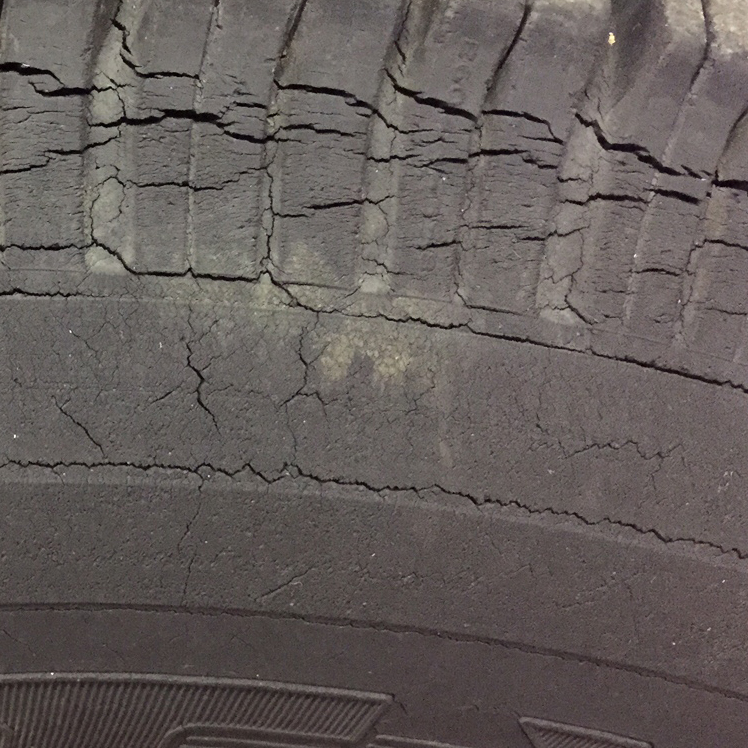

In [7]:
PIL.Image.open(str(defective_tyre[0]))

In [8]:
good_tyre = list(data_dir.glob('good/*.jpg'))
good_tyre[:5]

[WindowsPath('D:/Tyre_Defect_Detection_System/Dataset/good/good (1).jpg'),
 WindowsPath('D:/Tyre_Defect_Detection_System/Dataset/good/good (10).jpg'),
 WindowsPath('D:/Tyre_Defect_Detection_System/Dataset/good/good (100).jpg'),
 WindowsPath('D:/Tyre_Defect_Detection_System/Dataset/good/good (101).jpg'),
 WindowsPath('D:/Tyre_Defect_Detection_System/Dataset/good/good (102).jpg')]

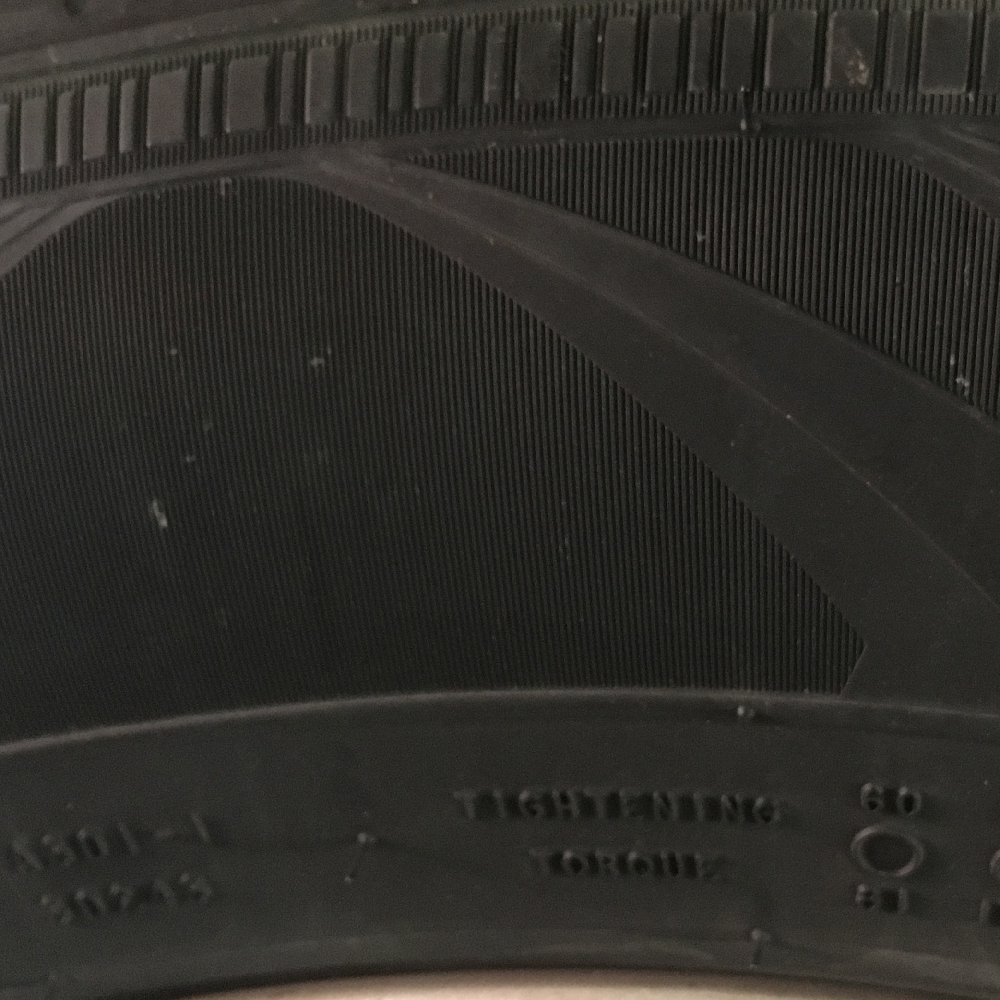

In [9]:
PIL.Image.open(str(good_tyre[0]))

In [10]:
alltyre_dict = {'defective': defective_tyre, 'good': good_tyre}

In [11]:
all_tyre_labels = {
    'defective': 1,
    'good': 0
}

In [12]:
alltyre_dict['defective'][0]

WindowsPath('D:/Tyre_Defect_Detection_System/Dataset/defective/Defective (1).jpg')

In [13]:
img = cv2.imread(alltyre_dict['defective'][0])
img.shape

(748, 748, 3)

In [14]:
cv2.resize(img,(224,224)).shape

(224, 224, 3)

In [15]:
x, y = [], []
for category in alltyre_dict.keys():
    for img_path in alltyre_dict[category]:
        img = cv2.imread(str(img_path))
        resized_img = cv2.resize(img, (224, 224))
        x.append(resized_img)
        y.append(all_tyre_labels[category])

In [16]:
y[:5]

[1, 1, 1, 1, 1]

In [17]:
x = np.array(x)
y = np.array(y)

In [18]:
print(f"x shape: {np.array(x).shape}")
print(f"y shape: {np.array(y).shape}")

x shape: (1856, 224, 224, 3)
y shape: (1856,)


In [19]:
x_train, x_test, y_train, y_test = train_test_split(x, y,test_size=0.2,random_state=0, stratify=y)

In [20]:
x_train_scaled = x_train / 255.0
x_test_scaled = x_test / 255.0

In [21]:
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
model = Sequential([
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    BatchNormalization(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    BatchNormalization(),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    Dropout(0.4),
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    Dropout(0.4),
    layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])
model.fit(x_train_scaled, y_train, epochs=30, validation_split=0.2)




Epoch 1/30


38/38 [==============================] - 272s 5s/step - loss: 12.7357 - accuracy: 0.5341 - val_loss: 0.8625 - val_accuracy: 0.4747
Epoch 2/30
38/38 [==============================] - 158s 4s/step - loss: 0.8054 - accuracy: 0.5788 - val_loss: 0.6915 - val_accuracy: 0.5320
Epoch 3/30
38/38 [==============================] - 237s 6s/step - loss: 0.6376 - accuracy: 0.6226 - val_loss: 0.6947 - val_accuracy: 0.5320
Epoch 4/30
38/38 [==============================] - 283s 7s/step - loss: 0.6438 - accuracy: 0.6158 - val_loss: 0.6769 - val_accuracy: 0.5320
Epoch 5/30
38/38 [==============================] - 206s 5s/step - loss: 0.6254 - accuracy: 0.6361 - val_loss: 0.7046 - val_accuracy: 0.5354
Epoch 6/30
38/38 [==============================] - 161s 4s/step - loss: 0.6068 - accuracy: 0.6504 - val_loss: 0.6826 - val_accuracy: 0.5690
Epoch 7/30
38/38 [==============================] - 139s 4s/step - loss: 0.6007 - accuracy: 0.6891 - val_loss: 0.7345 - val_accuracy: 0.5320
Epoch 8

In [22]:
model.evaluate(x_test_scaled, y_test)

12/12 [==============================] - 3s 279ms/step - loss: 0.6898 - accuracy: 0.5538


[0.6897553205490112, 0.5537634491920471]

In [23]:
y_pred_probs = model.predict(x_test_scaled)
y_pred = (y_pred_probs > 0.5).astype(int).flatten()

12/12 [==============================] - 4s 218ms/step


In [24]:
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy:.4f}")

Test Accuracy: 0.5538


In [25]:
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=['Good', 'Defective']))

Classification Report:
              precision    recall  f1-score   support

        Good       0.00      0.00      0.00       166
   Defective       0.55      1.00      0.71       206

    accuracy                           0.55       372
   macro avg       0.28      0.50      0.36       372
weighted avg       0.31      0.55      0.39       372



d:\Tyre_Defect_Detection_System\myenv\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
d:\Tyre_Defect_Detection_System\myenv\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
d:\Tyre_Defect_Detection_System\myenv\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result

In [26]:
predictions = model.predict(x_test_scaled)
predictions

12/12 [==============================] - 3s 221ms/step


array([[0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.51918936],
       [0.519

In [27]:
data_augmentation = keras.Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical",3),
    layers.experimental.preprocessing.RandomRotation(0.1),
    layers.experimental.preprocessing.RandomZoom(0.1),
    layers.experimental.preprocessing.RandomContrast(0.2),
  ])

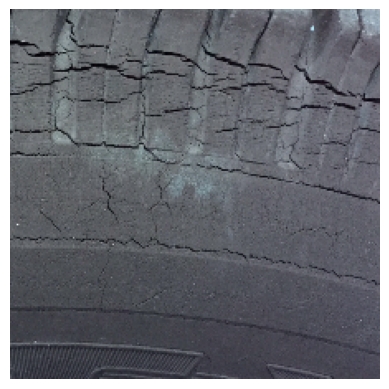

In [28]:
plt.axis('off')
plt.imshow(x[0])

In [ ]:
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

model = Sequential([
    data_augmentation,
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    BatchNormalization(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    BatchNormalization(),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    Dropout(0.4),
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    Dropout(0.4),
    layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3)
model.fit(x_train_scaled, y_train, epochs=30, validation_split=0.2, callbacks=[early_stop, lr_scheduler])

Epoch 1/30
38/38 [==============================] - 67s 2s/step - loss: 9.7641 - accuracy: 0.5442 - val_loss: 0.7923 - val_accuracy: 0.4680 - lr: 0.0010
Epoch 2/30
38/38 [==============================] - 58s 2s/step - loss: 1.0402 - accuracy: 0.5636 - val_loss: 0.6865 - val_accuracy: 0.5320 - lr: 0.0010
Epoch 3/30
38/38 [==============================] - 56s 1s/step - loss: 0.6505 - accuracy: 0.6327 - val_loss: 0.6922 - val_accuracy: 0.5320 - lr: 0.0010
Epoch 4/30
38/38 [==============================] - 59s 2s/step - loss: 0.6398 - accuracy: 0.6276 - val_loss: 0.6913 - val_accuracy: 0.5320 - lr: 0.0010
Epoch 5/30
38/38 [==============================] - 59s 2s/step - loss: 0.6403 - accuracy: 0.6377 - val_loss: 0.7035 - val_accuracy: 0.5320 - lr: 0.0010
Epoch 6/30
38/38 [==============================] - 64s 2s/step - loss: 0.6256 - accuracy: 0.6731 - val_loss: 0.6987 - val_accuracy: 0.5320 - lr: 5.0000e-04
Epoch 7/30
38/38 [==============================] - 66s 2s/step - loss: 0.6209

In [30]:
model.evaluate(x_test_scaled,y_test)

12/12 [==============================] - 11s 286ms/step - loss: 0.5162 - accuracy: 0.7446


[0.5162041187286377, 0.7446236610412598]

In [31]:
y_pred_probs = model.predict(x_test_scaled)
y_pred = (y_pred_probs>0.5).astype(int).flatten()

12/12 [==============================] - 5s 277ms/step


In [32]:
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy:.4f}")

Test Accuracy: 0.7446


In [ ]:
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=['Good', 'Defective']))

Classification Report:
              precision    recall  f1-score   support

        Good       0.77      0.61      0.68       166
   Defective       0.73      0.85      0.79       206

    accuracy                           0.74       372
   macro avg       0.75      0.73      0.73       372
weighted avg       0.75      0.74      0.74       372



In [ ]:
model.save('tyre.h5')

d:\Tyre_Defect_Detection_System\myenv\Lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
model.save('tyre_defect_model', save_format='tf')

INFO:tensorflow:Assets written to: tyre_defect_model\assets


INFO:tensorflow:Assets written to: tyre_defect_model\assets
